In [ ]:
# downloading data
!git clone https://github.com/rslim087a/track

fatal: destination path 'track' already exists and is not an empty directory.


In [ ]:
# Operating System library for interacting with the file system
import os

# NumPy library for numerical operations and array manipulation
import numpy as np

# Matplotlib library for creating visualizations such as plots and graphs
import matplotlib.pyplot as plt

# TensorFlow library for machine learning and deep learning tasks
from tensorflow import keras
import tensorflow as tf

# Sequential model from Keras for building a linear stack of layers
from keras.models import Sequential

# Layers for the neural network from Keras
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, Conv2D

# Utility functions from scikit-learn for data manipulation
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

# Image augmentation library for augmenting image data
from imgaug import augmenters as iaa

# OpenCV library for computer vision tasks
import cv2

# Pandas library for data manipulation and analysis
import pandas as pd

# ntpath module for handling file paths
import ntpath

# Random module for generating random numbers
import random

# Matplotlib's image module for loading and displaying images
import matplotlib.image as mpimg

In [ ]:
# Define the directory where the CSV file is located
datadir = 'track'

# Define the column names for the dataset
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse','speed']

# Read the CSV file into a Pandas DataFrame using the specified column names
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)


# Set an option to display the entire content of each column (no truncation) when printing the DataFrame
pd.set_option('display.max_colwidth', -1)

# Display the first few rows of the DataFrame to inspect the data
data.head()

<ipython-input-40-ada2f2766276>:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [ ]:
# Define a function named path_leaf that takes a file path as input
def path_leaf(path):

  # Split the path into the head (directory) and tail (file name)
  head, tail = ntpath.split(path)

  # Return the file name (tail)
  return tail

# Apply the path_leaf function to the 'center' column of the 'data' DataFrame
data['center'] = data['center'].apply(path_leaf)

# Apply the path_leaf function to the 'left' column of the 'data' DataFrame
data['left'] = data['left'].apply(path_leaf)

# Apply the path_leaf function to the 'right' column of the 'data' DataFrame
data['right'] = data['right'].apply(path_leaf)

# Display the first few rows of the modified 'data' DataFrame
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


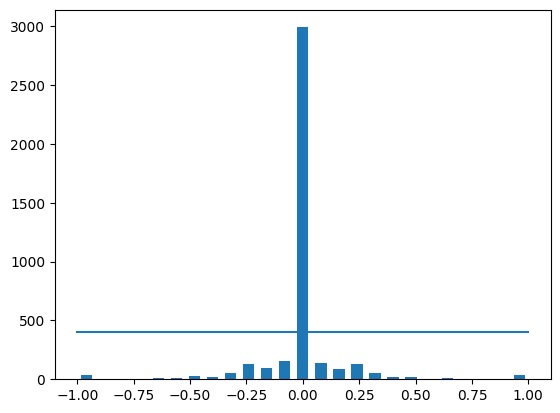

In [ ]:
# Setting the number of bins for the histogram
num_bins = 25

# Specifying the number of samples per bin
samples_per_bin = 400

# Creating a histogram of the 'steering' data with the specified number of bins
# The 'data' variable is assumed to be a DataFrame with a 'steering' column
hist, bins = np.histogram(data['steering'], num_bins)

# Calculating the center of each bin
center = (bins[:-1]+ bins[1:]) * 0.5

# Creating a bar plot using the calculated bin centers, histogram values, and specifying the bar width
plt.bar(center, hist, width=0.05)

# Plotting a line across the entire range of 'steering' values to indicate the desired number of samples per bin
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
# Print the length of the data (number of elements if 1D, rows if 2D, etc.)
print('Length of data: ', len(data))

# Print the shape of the data (number of rows and columns for 2D data, and so on)
print('Shape of data: ', data.shape)

Length of data:  4053
Shape of data:  (4053, 7)


In [ ]:

# Initialize an empty list to store indices of samples to be removed
remove_list = []

# Iterate through each bin
for j in range(num_bins):

  # Initialize an empty list to store indices of samples within the current bin
  list_ = []

  # Iterate through each sample in the 'steering' data
  for i in range(len(data['steering'])):

    # Check if the steering angle of the current sample falls within the current bin
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:

      # If yes, add the index of the sample to the list
      list_.append(i)

  # Shuffle the list of indices
  list_ = shuffle(list_)

  # Remove a certain number of samples (samples_per_bin) from the beginning of the list
  list_ = list_[samples_per_bin:]

  # Extend the remove_list with the indices of samples to be removed
  remove_list.extend(list_)

# Print the number of samples removed
print('removed:', len(remove_list))

# Drop the rows corresponding to the indices in remove_list from the 'data' DataFrame
data.drop(data.index[remove_list], inplace=True)

# Print the number of remaining samples in the 'data' DataFrame
print('remaining:', len(data))

removed: 2590
remaining: 1463


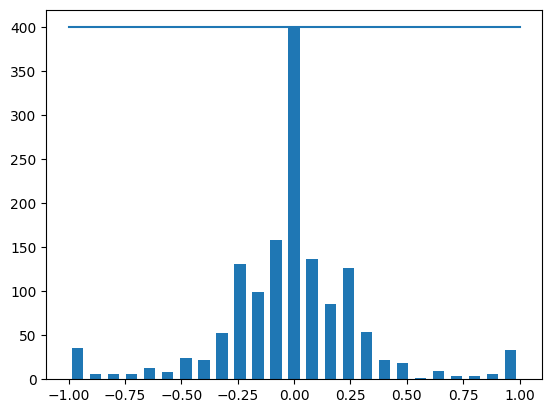

In [ ]:
# Generate histogram of the 'steering' column with specified number of bins
hist, _ = np.histogram(data['steering'], (num_bins))

# Plot the histogram using a bar chart
plt.bar(center, hist, width=0.05)

# Plot a horizontal line at the level of 'samples_per_bin' across the entire range of 'steering' values
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
# Define the function with parameters datadir (data directory) and df (DataFrame)
def load_img_steering(datadir, df):

  # Initialize empty lists to store image paths and steering angles
  image_path = []
  steering = []

  # Iterate through the rows of the DataFrame 'data'
  for i in range(len(data)):

    # Access the i-th row of the DataFrame
    indexed_data = data.iloc[i]

    # Extract center, left, and right image paths from the row
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

    # Append the absolute paths of the images to the list, stripping any extra spaces
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))

    # Left image append with a steering angle adjustment (+0.15)
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)


    # Right image append with a steering angle adjustment (-0.15)
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)

  # Convert the lists to NumPy arrays
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  # Return the image paths and corresponding steering angles as NumPy arrays
  return image_paths, steerings

In [ ]:
# '/IMG' is appended to datadir to create the complete path to the image directory
image_paths, steerings = load_img_steering(datadir + '/IMG', data)


In [ ]:
# Find the length of image_paths
len(image_paths)


4389

In [ ]:
# Find the length of steerings
len(steerings)


4389

In [ ]:
# Split the dataset into training and validation sets
# image_paths: input data (list of file paths to images)
# steerings: target variable (list of corresponding steering angles)
# test_size: the proportion of the dataset to include in the validation split (here, 20%)
# random_state: seed for reproducibility (here, set to 6)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

# Print the number of samples in the training and validation sets
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation set')

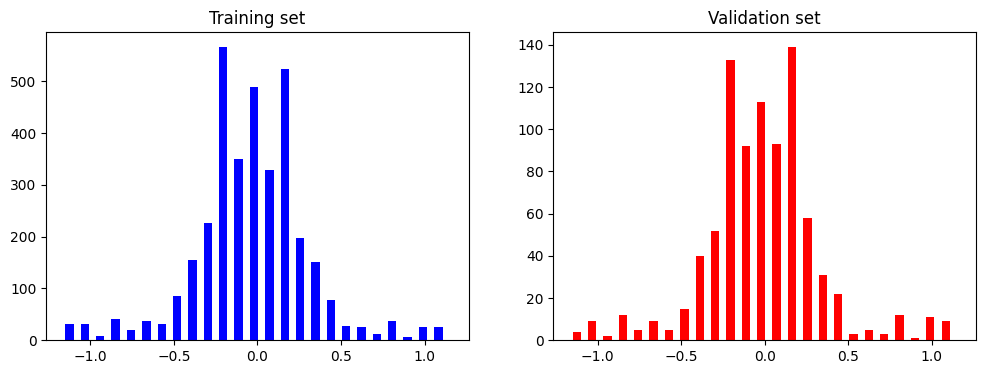

In [ ]:
# Create a figure with two subplots arranged in a single row
# 'fig' is the figure object, and 'axes' is an array containing the two subplot axes
fig, axes = plt.subplots(1, 2, figsize=(12, 4))\

# Plot the histogram on the first subplot (axes[0]) for the training set ('y_train')
# 'bins' specify the number of bins in the histogram
# 'width' sets the width of the bins in the histogram
# 'color' sets the color of the bars in the histogram to blue
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')

# Set the title of the first subplot to 'Training set'
axes[0].set_title('Training set')

# Plot the histogram on the second subplot (axes[1]) for the validation set ('y_valid')
# 'bins', 'width', and 'color' are similar to the first subplot
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')

# Set the title of the second subplot to 'Validation set'
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

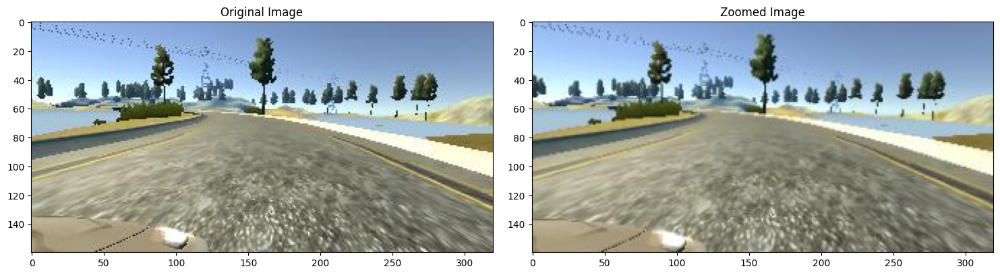

In [ ]:
# Function to apply zoom augmentation to an image
def zoom(image):

  # Define a zoom transformation with a scale factor between 1 and 1.3
  zoom = iaa.Affine(scale=(1, 1.3))

  # Apply the zoom transformation to the image
  image = zoom.augment_image(image)

  # Return the zoomed image
  return image

# Randomly select an image path from a set of paths (assuming 'image_paths' is defined elsewhere)
image = image_paths[random.randint(0, 1000)]

# Read the original image using matplotlib's imread function
original_image = mpimg.imread(image)

# Apply the zoom function to the original image
zoomed_image = zoom(original_image)

# Create a subplot with two images side by side for comparison
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# Display the original image in the first subplot
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# Display the zoomed image in the second subplot
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

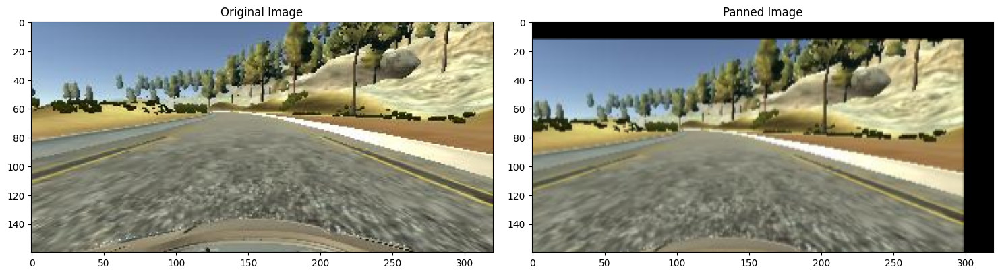

In [ ]:
# Define a function for panning (translating) an image using imgaug
def pan(image):

  # Create an Affine transformation with random translation
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})

  # Apply the panning transformation to the input image
  image = pan.augment_image(image)

  # Return the transformed image
  return image

# Select a random image path (assuming there are image_paths available)
image = image_paths[random.randint(0, 1000)]

# Read the original image using matplotlib's imread function
original_image = mpimg.imread(image)

# Apply the panning transformation to the original image
panned_image = pan(original_image)

# Create subplots to display the original and panned images side by side
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# Display the original image in the first subplot
axs[0].imshow(original_image)
axs[0].set_title('Original Image')


# Display the panned image in the second subplot
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

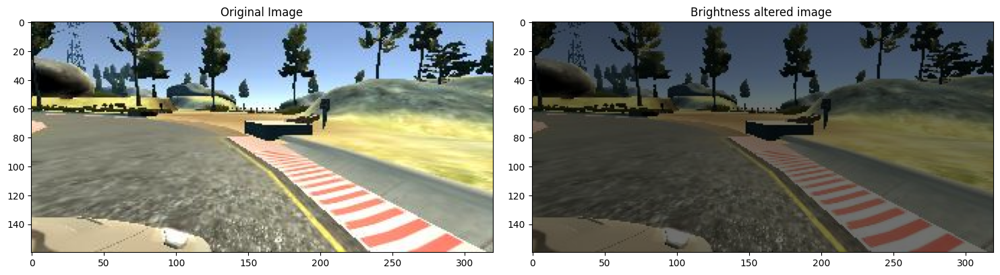

In [ ]:
# Function to randomly alter the brightness of an image
def img_random_brightness(image):

    # Define the brightness augmentation object using the Multiply function
    # The brightness factor is randomly chosen between 0.2 and 1.2
    brightness = iaa.Multiply((0.2, 1.2))

    # Apply the brightness augmentation to the input image
    image = brightness.augment_image(image)

    # Return the altered image
    return image

# Randomly select an image path
image = image_paths[random.randint(0, 1000)]

# Read the original image using matplotlib
original_image = mpimg.imread(image)

# Call the img_random_brightness function to alter the brightness of the original image
brightness_altered_image = img_random_brightness(original_image)

# Create a subplot with 1 row and 2 columns for displaying original and altered images
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# Display the original image in the first subplot
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# Display the brightness altered image in the second subplot
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.15')

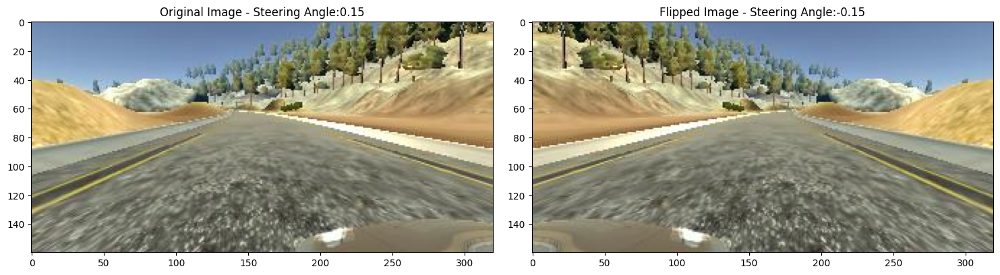

In [ ]:
# Function to randomly flip the image and negate the steering angle
def img_random_flip(image, steering_angle):

    # Flip the image horizontally
    image = cv2.flip(image,1)

    # Negate the steering angle
    steering_angle = -steering_angle

    # Return the flipped image and steering angle
    return image, steering_angle


# Generate a random index within the range [0, 1000]
random_index = random.randint(0, 1000)

# Select an image path and steering angle using the random index
image = image_paths[random_index]
steering_angle = steerings[random_index]

# Read the original image using Matplotlib
original_image = mpimg.imread(image)

# Call the img_random_flip function to get the flipped image and steering angle
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

# Create a subplot with 1 row and 2 columns
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

# Display the original image in the first subplot
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

# Display the flipped image in the second subplot
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
# Define the function random_augment
def random_augment(image, steering_angle):

    # Read the image using matplotlib's imread function
    image = mpimg.imread(image)

    # Apply pan augmentation with a 50% probability
    if np.random.rand() < 0.5:
      image = pan(image)

    # Apply zoom augmentation with a 50% probability
    if np.random.rand() < 0.5:
      image = zoom(image)

    # Apply random brightness augmentation with a 50% probability
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)

    # Apply random flip augmentation with a 50% probability
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    # Return the augmented image and the corresponding steering angle
    return image, steering_angle

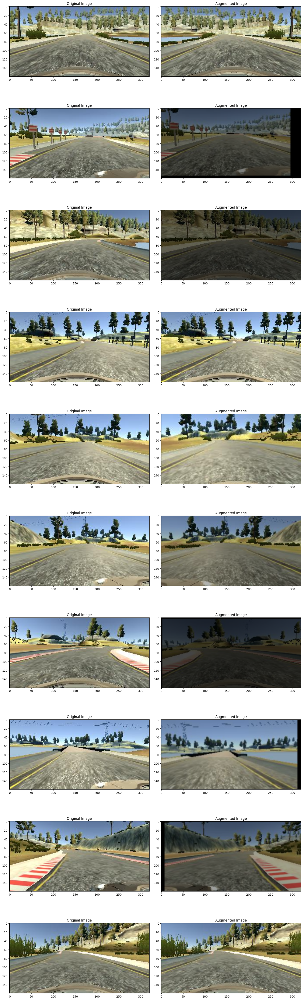

In [ ]:
# Set the number of columns and rows for the subplot grid
ncol = 2
nrow = 10


# Create a subplot grid with nrow rows and ncol columns
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()


# Loop through each row of the subplot grid
for i in range(10):

  # Randomly select an index to get a random image and its steering value
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  # Read the original image from the selected file path
  original_image = mpimg.imread(random_image)

  # Call a function 'random_augment' to obtain an augmented image and its corresponding steering value
  augmented_image, steering = random_augment(random_image, random_steering)

  # Display the original image in the first column of the current row
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  # Display the augmented image in the second column of the current row
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
# Define a function named img_preprocess that takes an image as input
def img_preprocess(img):

    # Crop the image, keeping only the region of interest (ROI) from 60 to 135 rows (y-axis), and all columns (x-axis)
    img = img[60:135,:,:]

    # Convert the color space of the image from RGB to YUV
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)

    # Apply a Gaussian blur to the image to reduce noise and smooth the image
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.GaussianBlur(img,  (3, 3), 0)

    # Resize the image to a specified width and height (200 columns, 66 rows)
    img = cv2.resize(img, (200, 66))

    # Normalize the pixel values of the image to the range [0, 1] by dividing by 255
    img = img/255

    # Return the preprocessed image
    return img

Text(0.5, 1.0, 'Preprocessed Image')

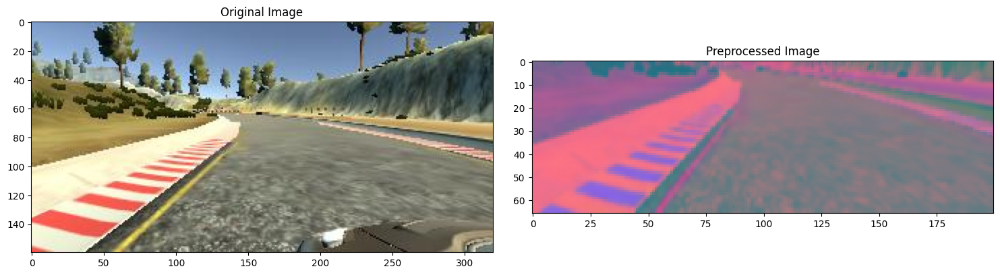

In [ ]:
# Select the 101st image from the list
image = image_paths[100]

# Read the image using matplotlib's imread function
original_image = mpimg.imread(image)

# Perform some preprocessing on the original image
preprocessed_image = img_preprocess(original_image)


# Create a figure with two subplots (1 row, 2 columns) and set the size
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# Adjust the layout of the subplots to prevent overlapping
fig.tight_layout()

# Plot the original image on the first subplot
axs[0].imshow(original_image)
axs[0].set_title('Original Image')

# Plot the preprocessed image on the second subplot
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
!nvidia-smi


Mon Dec 18 13:45:17 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   71C    P0              32W /  70W |   1157MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# Check if GPU is available
import torch

if torch.cuda.is_available():
    # Get the GPU information
    gpu_info = !nvidia-smi --query-gpu=gpu_name --format=csv,noheader
    if gpu_info:
        gpu_name = gpu_info[0].strip()
        print(f"GPU: {gpu_name}")
    else:
        print("Unable to determine GPU name.")
else:
    print("No GPU available.")


GPU: Tesla T4


In [ ]:
# Function to generate batches of training data
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  # Infinite loop to keep generating batches
  while True:

    # Lists to store images and corresponding steering angles for the batch
    batch_img = []
    batch_steering = []

    # Loop to fill the batch with random samples
    for i in range(batch_size):

      # Randomly select an index from the provided image_paths
      random_index = random.randint(0, len(image_paths) - 1)

      # Check if it is a training batch and apply data augmentation
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:

        # If not training, simply read the image
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      # Preprocess the image
      im = img_preprocess(im)

      # Append the preprocessed image and steering angle to the batch lists
      batch_img.append(im)
      batch_steering.append(steering)

    # Yield the batch as a tuple of NumPy arrays
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [ ]:
# For training data:
# Generate a batch of training data and labels with batch size 1 (1 sample per batch).
# x_train_gen is the generated batch of training data, and y_train_gen is the corresponding labels.
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))

# For validation data:
# Generate a batch of validation data and labels with batch size 1 (1 sample per batch).
# x_valid_gen is the generated batch of validation data, and y_valid_gen is the corresponding labels.
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

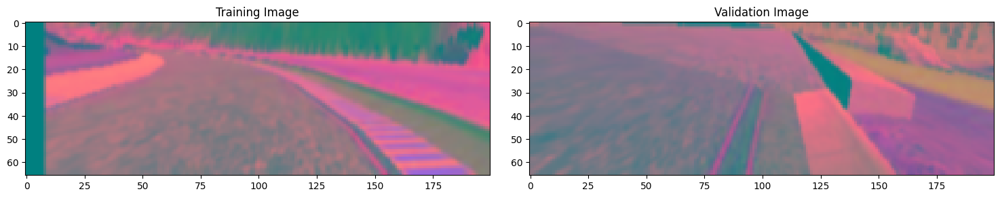

In [ ]:
# Create a subplot with 1 row and 2 columns of subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 10))

# Adjust the layout of the subplots for better appearance
fig.tight_layout()

# Display the first training image in the first subplot
axs[0].imshow(x_train_gen[0])
# Set the title of the first subplot
axs[0].set_title('Training Image')

# Display the first validation image in the second subplot
axs[1].imshow(x_valid_gen[0])
# Set the title of the second subplot
axs[1].set_title('Validation Image')

In [ ]:
# Define a function to create a specific neural network model for NVIDIA's self-driving car model
def nvidia_model():

  # Create a Sequential model
  model = Sequential()

  # Convolutional layers with ELU activation function
  # Input shape is (66, 200, 3)
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))

  # Flatten the output for fully connected layers
  model.add(Flatten())


  # Fully connected layers with ELU activation function
  model.add(Dense(100, activation = 'elu'))
  model.add(Dense(50, activation = 'elu'))
  model.add(Dense(10, activation = 'elu'))

  # Output layer with linear activation (no activation function)
  model.add(Dense(1))


  # Define the Adam optimizer with a learning rate of 1e-3
  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

  # Compile the model using mean squared error (MSE) as the loss function and the defined optimizer
  model.compile(loss='mse', optimizer=optimizer)

  # Return the compiled mode
  return model

# Create the NVIDIA model by calling the function
model = nvidia_model()

# Print the summary of the model architecture
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_6 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_7 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)               115300    
                                                                 
 dense_5 (Dense)             (None, 50)               

In [ ]:
# Training data generator
history = model.fit_generator(
                                  # Training configuration:
                                  # - steps_per_epoch: Number of batches to process in each epoch. In this case, 300 batches.
                                  # - epochs: Number of times to iterate over the entire training dataset. In this case, 15 epochs.
                                  # - validation_data: Validation data generator.
                                  # - validation_steps: Number of batches to process in each validation epoch. In this case, 200 batches.
                                  # - verbose: Verbosity mode. 1 means to print progress during training.
                                  # - shuffle: Whether to shuffle the training data at the beginning of each epoch.
                                  batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=15,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-66-0ffd81d2c219>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/15
300/300 [==============================] - 120s 394ms/step - loss: 0.1518 - val_loss: 0.0683
Epoch 2/15
300/300 [==============================] - 116s 389ms/step - loss: 0.0701 - val_loss: 0.0589
Epoch 3/15
300/300 [==============================] - 113s 377ms/step - loss: 0.0670 - val_loss: 0.0520
Epoch 4/15
300/300 [==============================] - 127s 424ms/step - loss: 0.0576 - val_loss: 0.0414
Epoch 5/15
300/300 [==============================] - 124s 413ms/step - loss: 0.0517 - val_loss: 0.0391
Epoch 6/15
300/300 [==============================] - 119s 398ms/step - loss: 0.0469 - val_loss: 0.0321
Epoch 7/15
300/300 [==============================] - 113s 379ms/step - loss: 0.0451 - val_loss: 0.0322
Epoch 8/15
300/300 [==============================] - 120s 403ms/step - loss: 0.0440 - val_loss: 0.0314
Epoch 9/15
300/300 [==============================] - 113s 377ms/step - loss: 0.0424 - val_loss: 0.0313
Epoch 10/15
300/300 [==============================] - 113s 378m

In [ ]:
# Printing a summary of the model architecture
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_6 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_7 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)               115300    
                                                                 
 dense_5 (Dense)             (None, 50)               

Text(0.5, 0, 'Epoch')

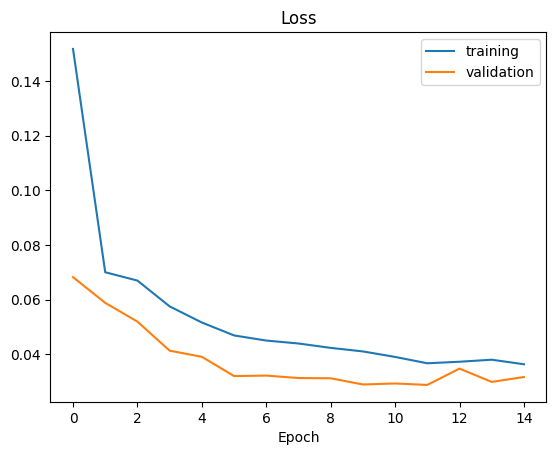

In [ ]:
# Plot the training loss over epochs
plt.plot(history.history['loss'])

# Plot the validation loss over epochs
plt.plot(history.history['val_loss'])

# Add a legend to the plot to distinguish between training and validation curves
plt.legend(['training', 'validation'])

# Set the title of the plot
plt.title('Loss')

# Label the x-axis with 'Epoch'
plt.xlabel('Epoch')


In [ ]:
# Save the model to a file named 'model.h5'.
model.save('model.h5')

# Import the 'files' module from the 'google.colab' library, which is used to interact with files in a Google Colab environment.
from google.colab import files

# Download the saved model file 'model.h5' from the Colab environment to your local machine.
files.download('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>